# <center> **Assignment 1 – The 2024 summer Olympics** </center>

### <center>Made by:</center>

<center>Adrian A. Aydas, Lasse Strandbygaard & Mats Rettedal</center>

This Jupyter Notebook contains our answers for Assignment 1 questions one to three. For solving this assignment we use the framework presented in the book HML having the following structure:

* **1. Get data** 

* **2. Explore and visualize the data to gain insights**

* **3. Prepare the data for Machine Learning algorithms**

* **4. Select model and train (Cluster Analysis)**
   * *Use Kmeans*
   * *Silhoute & Elbow methods*
   * *Use DBSCAN*

Aftewards, we make a Principal Component Analysis (*PCA*) for detecting relevant features and make our final predictions based on these selected features.

## **1. Get the data**

In [1]:
# Importing the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
calendar_df = pd.read_csv('march_calendar.csv.gz', compression='gzip')
listings_df = pd.read_csv('june_listings.csv')
reviews_df = pd.read_csv('reviews.csv.gz', compression='gzip')

/var/folders/ck/_b2fnrn152vbbcxt5jf9gfth0000gn/T/ipykernel_27254/3945030258.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  calendar_df = pd.read_csv('march_calendar.csv.gz', compression='gzip')


In [3]:
df = listings_df.copy()

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95885 entries, 0 to 95884
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              95885 non-null  int64  
 1   name                            95885 non-null  object 
 2   host_id                         95885 non-null  int64  
 3   host_name                       95877 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   95885 non-null  object 
 6   latitude                        95885 non-null  float64
 7   longitude                       95885 non-null  float64
 8   room_type                       95885 non-null  object 
 9   price                           74579 non-null  float64
 10  minimum_nights                  95885 non-null  int64  
 11  number_of_reviews               95885 non-null  int64  
 12  last_review                     

In [5]:
df.isnull().sum()/len(df)*100

id                                  0.000000
name                                0.000000
host_id                             0.000000
host_name                           0.008343
neighbourhood_group               100.000000
neighbourhood                       0.000000
latitude                            0.000000
longitude                           0.000000
room_type                           0.000000
price                              22.220368
minimum_nights                      0.000000
number_of_reviews                   0.000000
last_review                        33.569380
reviews_per_month                  33.569380
calculated_host_listings_count      0.000000
availability_365                    0.000000
number_of_reviews_ltm               0.000000
license                            20.698754
dtype: float64

In [6]:
df["calendar_price"] = np.nan

In [7]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,calendar_price
0,7241227,Appartement F2 de 50m2,23740469,Marie Josee,NaN,Buttes-Montmartre,48.889930,2.366960,Entire home/apt,NaN,365,2,2018-08-25,0.03,1,0,0,NaN,NaN
1,738818740125140768,Studette calme paris,33108376,Kaïs,NaN,Passy,48.852160,2.262300,Entire home/apt,NaN,4,6,2023-09-26,0.30,1,0,2,7511607442416,NaN
2,6640639,Chambre de Bonne,34756427,Ricardo,NaN,Vaugirard,48.831000,2.289190,Entire home/apt,NaN,365,0,NaN,NaN,1,0,0,NaN,NaN
3,8387171,Faidherbe Chaligny Square,44188365,Benoit,NaN,Reuilly,48.848980,2.386090,Entire home/apt,NaN,365,0,NaN,NaN,1,0,0,NaN,NaN
4,1097932353733680407,Beau studio au cœur de Barbès,514983472,Rebaia,NaN,Buttes-Montmartre,48.886598,2.359753,Entire home/apt,NaN,1,2,2024-04-07,0.59,1,0,2,7511808567461,NaN


In [8]:
missing_price = df[df["price"].isnull()]
missing_price.shape

(21306, 19)

In [9]:
calendar_df = calendar_df[calendar_df["date"] <= "2024-08-11"]
calendar_df.shape

(12395365, 7)

In [10]:
# Transform date and price columns
calendar_df["price"] = calendar_df["price"].str.replace("$", "").str.replace(",", "").astype(float)
calendar_df["date"] = pd.to_datetime(calendar_df["date"])

In [11]:
missing_price_calendar = calendar_df[calendar_df["listing_id"].isin(df["id"])]
missing_price_calendar.shape

(11247424, 7)

In [12]:
calendar_df.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,3109,2024-03-19,f,250.0,NaN,2.0,30.0
1,3109,2024-03-20,t,250.0,NaN,2.0,30.0
2,3109,2024-03-21,t,250.0,NaN,2.0,30.0
3,3109,2024-03-22,t,250.0,NaN,2.0,30.0
4,3109,2024-03-23,t,250.0,NaN,2.0,30.0


In [13]:
median_price = missing_price_calendar.groupby("listing_id")["price"].median().reset_index()
median_price

,listing_id,price
0,3109,250.0
1,5396,150.0
2,7397,130.0
3,7964,180.0
4,9359,75.0
...,...,...
76581,1112877068097653245,161.0
76582,1113017935643461606,150.0
76583,1113046739746819958,286.0
76584,1113047125584675660,257.0


In [14]:
df["calendar_price"] = df["calendar_price"].fillna(df["id"]).map(median_price.set_index("listing_id")["price"])

In [15]:
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             8
neighbourhood_group               95885
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                             21306
minimum_nights                        0
number_of_reviews                     0
last_review                       32188
reviews_per_month                 32188
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           19847
calendar_price                    19299
dtype: int64

In [16]:
miss_price1 = df[df["price"].isnull() & df["calendar_price"].isnull()]
miss_price1.shape

(500, 19)

In [17]:
df = df.dropna(subset=["price", "calendar_price"], how="all")
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             8
neighbourhood_group               95385
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                             20806
minimum_nights                        0
number_of_reviews                     0
last_review                       31901
reviews_per_month                 31901
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           19777
calendar_price                    18799
dtype: int64

In [18]:
df["price"] = df["price"].fillna(df["calendar_price"])
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             8
neighbourhood_group               95385
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       31901
reviews_per_month                 31901
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           19777
calendar_price                    18799
dtype: int64

In [19]:
# find subset of listings with 0 reviews
null_reviews = df[df['number_of_reviews'] == 0]
null_reviews.shape

(31901, 19)

In [20]:
# find the rows in reviews data corresponding to the IDs in null_reviews
null_reviews_data = reviews_df[reviews_df['listing_id'].isin(null_reviews['id'])]
null_reviews_data.shape

(22101, 6)

In [21]:
# make a new data frame with the number of reviews per listing
num_reviews = reviews_df.groupby('listing_id').size().reset_index(name='num_reviews')

# only inlcude listings with more than 0 reviews
num_reviews = num_reviews[num_reviews['num_reviews'] > 0]
num_reviews.shape

(67176, 2)

In [22]:
# For each listing in df with 0 reviews, find the listing in num_reviews and substitute the number of reviews with the value in num_reviews
for i in null_reviews.index:
    num_reviews_value = num_reviews[num_reviews['listing_id'] == df.loc[i, 'id']]['num_reviews']
    if not num_reviews_value.empty:
        df.loc[i, 'number_of_reviews'] = num_reviews_value.values[0]

In [23]:
df[df['number_of_reviews'] == 0].shape

(26775, 19)

In [24]:
df.drop(["host_name", 'host_id', "license", "last_review", "calendar_price"], axis=1, inplace=True)

In [25]:
df["neighbourhood"].value_counts()

neighbourhood
Buttes-Montmartre      10500
Popincourt              8389
Vaugirard               7755
Batignolles-Monceau     6809
Entrepôt                6531
Passy                   6386
Buttes-Chaumont         5434
Ménilmontant            5248
Opéra                   4550
Reuilly                 3983
Temple                  3803
Observatoire            3584
Gobelins                3282
Bourse                  3020
Panthéon                2985
Élysée                  2887
Hôtel-de-Ville          2805
Palais-Bourbon          2727
Luxembourg              2688
Louvre                  2019
Name: count, dtype: int64

In [26]:
df.isnull().sum()

id                                    0
name                                  0
neighbourhood_group               95385
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
reviews_per_month                 31901
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
dtype: int64

In [27]:
# Make three neighbourhood categories
city_center = ['Louvre', 'Bourse', 'Temple', 'Hôtel-de-Ville', 'Panthéon', 'Luxembourg']
inner_city = ['Palais-Bourbon', 'Élysée', 'Opéra', 'Entrepôt', 'Popincourt', 'Reuilly']
outer_city =['Gobelins', 'Observatoire', 'Vaugirard', 'Passy', 'Batignolles-Monceau', 'Buttes-Montmartre', 'Buttes-Chaumont', 'Ménilmontant']

# fill out neighbourhood_group based on the neighbourhood
df['neighbourhood_group'] = np.nan
df.loc[df['neighbourhood'].isin(city_center), 'neighbourhood_group'] = 'city_center'
df.loc[df['neighbourhood'].isin(inner_city), 'neighbourhood_group'] = 'inner_city'
df.loc[df['neighbourhood'].isin(outer_city), 'neighbourhood_group'] = 'outer_city'

/var/folders/ck/_b2fnrn152vbbcxt5jf9gfth0000gn/T/ipykernel_27254/2567792908.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'city_center' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[df['neighbourhood'].isin(city_center), 'neighbourhood_group'] = 'city_center'


In [28]:
df.drop(["neighbourhood"], axis=1, inplace=True)

In [29]:
df['neighbourhood_group'].value_counts()

neighbourhood_group
outer_city     48998
inner_city     29067
city_center    17320
Name: count, dtype: int64

In [30]:
df.isnull().sum()

id                                    0
name                                  0
neighbourhood_group                   0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
reviews_per_month                 31901
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
dtype: int64

In [31]:
# insert 0 for the missing values in the reviews_per_month column
df['reviews_per_month'] = df['reviews_per_month'].fillna(0)
df.isnull().sum()

id                                0
name                              0
neighbourhood_group               0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
dtype: int64

In [32]:
df = pd.get_dummies(df, columns=['neighbourhood_group', 'room_type'], drop_first=False)

# Convert only the dummy columns to int
dummy_cols = df.columns[df.columns.str.startswith(('neighbourhood_group_', 'room_type_'))]
df[dummy_cols] = df[dummy_cols].astype(int)

df.head()

,id,name,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,neighbourhood_group_city_center,neighbourhood_group_inner_city,neighbourhood_group_outer_city,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,7241227,Appartement F2 de 50m2,48.889930,2.366960,45.0,365,2,0.03,1,0,0,0,0,1,1,0,0,0
1,738818740125140768,Studette calme paris,48.852160,2.262300,49.0,4,6,0.30,1,0,2,0,0,1,1,0,0,0
2,6640639,Chambre de Bonne,48.831000,2.289190,50.0,365,0,0.00,1,0,0,0,0,1,1,0,0,0
3,8387171,Faidherbe Chaligny Square,48.848980,2.386090,100.0,365,0,0.00,1,0,0,0,1,0,1,0,0,0
4,1097932353733680407,Beau studio au cœur de Barbès,48.886598,2.359753,103.0,1,2,0.59,1,0,2,0,0,1,1,0,0,0


## **2. Exploratory Data Analysis**

In [33]:
# A function based on the code from the exercises 
def cov_corr_function(df, feature):
    """
    Computes the covariance and correlation of a given feature with all other numerical features in the DataFrame manually.
    
    Parameters:
        df (pd.DataFrame): The input DataFrame.
        feature (str): The column name of the feature to compare with others.
    
    Returns:
        pd.DataFrame: A DataFrame containing manually computed covariance and correlation values.
    """
    numerical_df = df.select_dtypes(include=[np.number]) # select numerical columns only

    if feature not in df.columns:
        raise ValueError(f"Vairable '{feature}' not found in DataFrame columns.")
    
    if feature not in numerical_df.columns:
        raise ValueError(f"Variable '{feature}' is not numerical.")
    
    # Calculate mean of first column
    total1 = 0
    n = len(numerical_df[feature])
    column1 = numerical_df[feature].tolist()
    for value in column1:
        total1 += value
    feature_mean = total1 / n 

    # Calculate standard deviation of first column
    total2 = 0
    for value in column1:
        total2 += (value - feature_mean) ** 2
    feature_std = (total2 / n) ** 0.5

    results = {}

    for col in numerical_df.columns:
        if col != feature:  # Compare feature with all others
            
            # Calculate mean of second column
            total3 = 0
            compare_col = numerical_df[col].tolist()
            for value in compare_col:
                total3 += value
            compare_mean = total3 / n

            # Calculate standard deviation of second column
            total4 = 0
            for value in compare_col:
                total4 += (value - compare_mean) ** 2
            compare_std = (total4 / n) ** 0.5
            
            # Compute covariance 
            sum_of_products = 0
            for i in range(n):
                diff1 = column1[i] - feature_mean
                diff2 = compare_col[i] - compare_mean
                sum_of_products += diff1 * diff2
            covariance = sum_of_products / n
            
            # Compute correlation 
            if feature_std > 0 and compare_std > 0:
                correlation = covariance / (feature_std * compare_std)
            else:
                correlation = 0  # Avoid division by zero
            
            results[col] = {'Covariance': covariance, 'Correlation': correlation}

    # Convert results to DataFrame
    result_df = pd.DataFrame.from_dict(results, orient='index')

    return result_df

In [34]:
def visualize_correlation(corr_df, feature):
    """
    Visualizes the correlation of a given feature with all other numerical features using Seaborn.
    
    Parameters:
        corr_df (pd.DataFrame): DataFrame containing correlation values.
        feature (str): The column name of the feature analyzed.
    """
    # Sort correlations in descending order
    corr_df_sorted = corr_df.sort_values(by='Correlation', ascending=False)
    
    # Plot using Seaborn
    plt.figure(figsize=(10, 6))
    sns.barplot(
        y=corr_df_sorted.index, 
        x=corr_df_sorted['Correlation'], 
        palette='coolwarm',
        hue=None
    )

    # Add vertical lines
    plt.axvline(0, color='black', linestyle='--', alpha=0.6)  # Center line
    plt.axvline(-0.1, color='black', linestyle='dotted', alpha=0.8)  # -0.1 line
    plt.axvline(0.1, color='black', linestyle='dotted', alpha=0.8)  # 0.1 line

    plt.axvline(0, color='black', linestyle='--', alpha=0.6)
    plt.xlabel('Correlation with ' + feature)
    plt.xlim(-1, 1)
    plt.ylabel('Features')
    plt.title(f'Correlation of Features with {feature}')
    plt.show()

In [35]:
cov_corr_function(df, 'price').sort_values(by='Correlation', ascending=False)

,Covariance,Correlation
room_type_Shared room,8.664040e+00,0.044779
id,2.423425e+19,0.016405
availability_365,4.863868e+03,0.013549
neighbourhood_group_inner_city,8.578198e+00,0.006217
neighbourhood_group_city_center,4.371536e+00,0.003783
room_type_Hotel room,8.543051e-01,0.003172
calculated_host_listings_count,7.446167e+02,0.002931
latitude,-1.062129e-03,-0.000019
room_type_Private room,-4.219270e+00,-0.004834
room_type_Entire home/apt,-5.299075e+00,-0.005746


/var/folders/ck/_b2fnrn152vbbcxt5jf9gfth0000gn/T/ipykernel_27254/1044093396.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


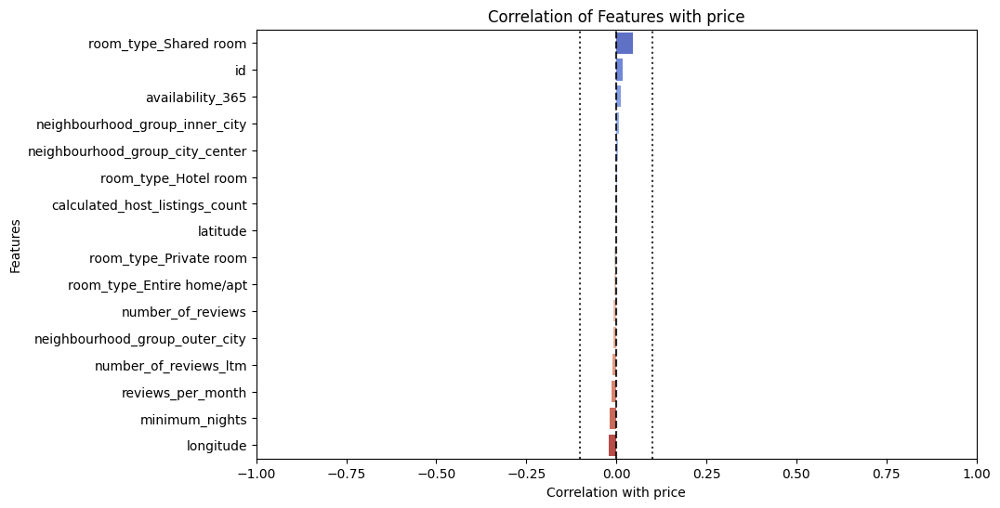

In [36]:
corr_df = cov_corr_function(df, 'price')
visualize_correlation(corr_df, 'price')

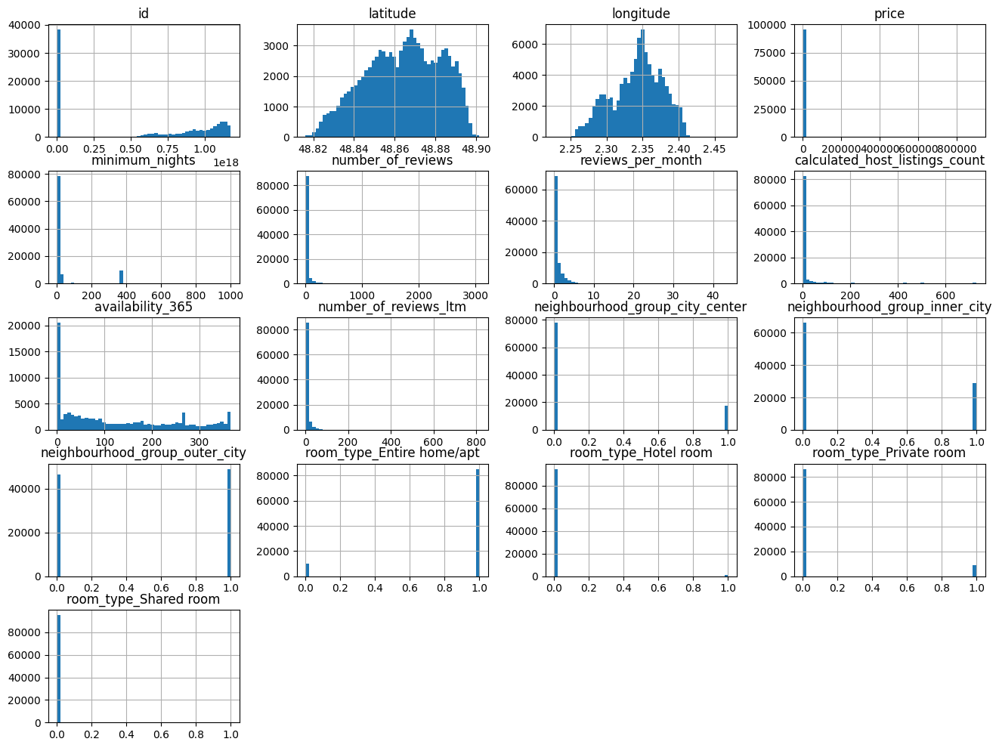

In [37]:
df.hist(bins=50, figsize=(16, 12))
plt.show();

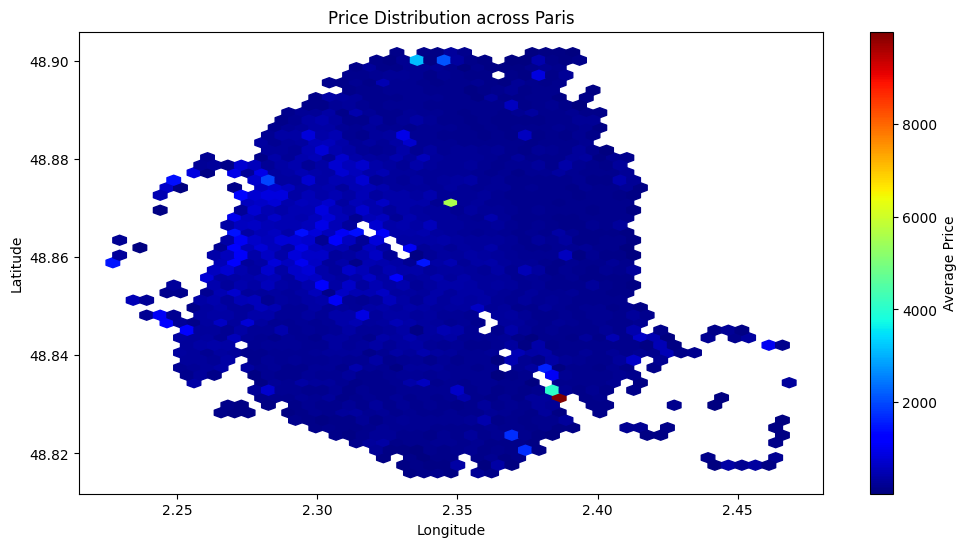

In [38]:
plt.figure(figsize=(12, 6))
plt.hexbin(df["longitude"], df["latitude"], C=df["price"], gridsize=50, cmap="jet", reduce_C_function=np.mean)
plt.colorbar(label="Average Price")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Price Distribution across Paris")
plt.show()

As we see there are no real linear correlation between any of the variables and the price. 

Therefore we have to transform price so a clear pattern might occur

## **3. Prepare the data for Machine Learning algorithms**

In [39]:
# Make transformations
from sklearn.preprocessing import FunctionTransformer

# Define a safe log function
def safe_log(x):
    return np.where(x > 0, np.log(x), 0)  # Apply log only to non-zero values, keep 0 as 0

# Define the inverse transformation
def safe_exp(x):
    return np.where(x > 0, np.exp(x), 0)  # Apply exp only where values were transformed


log_transformer = FunctionTransformer(safe_log, inverse_func=safe_exp, validate=True)
sqrt_transformer = FunctionTransformer(np.sqrt, inverse_func=np.square, validate=True)  # Square root
cube_transformer = FunctionTransformer(np.cbrt, inverse_func=lambda x: np.power(x, 3), validate=True)  # Cube root

### *Transform Price*

In [40]:
# remove listings with price = 0
df = df[df['price'] > 0]

/opt/miniconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but FunctionTransformer was fitted without feature names
  warnings.warn(


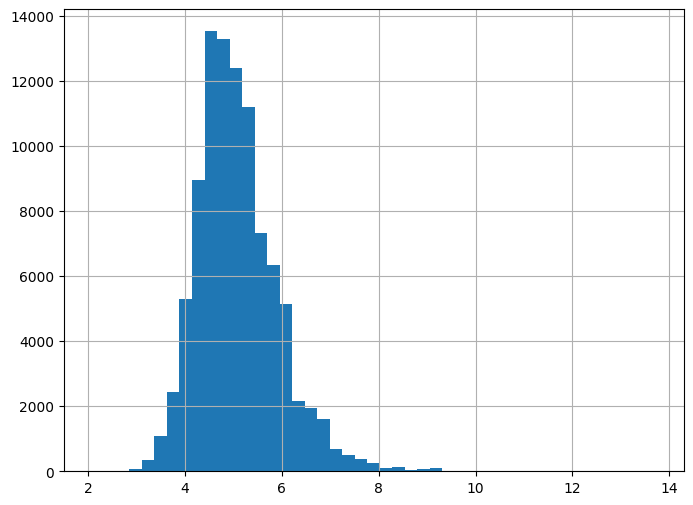

In [41]:
# transform the price column
df['price'] = log_transformer.transform(df[['price']])
df['price'].hist(bins=45, figsize=(8, 6))
plt.show();

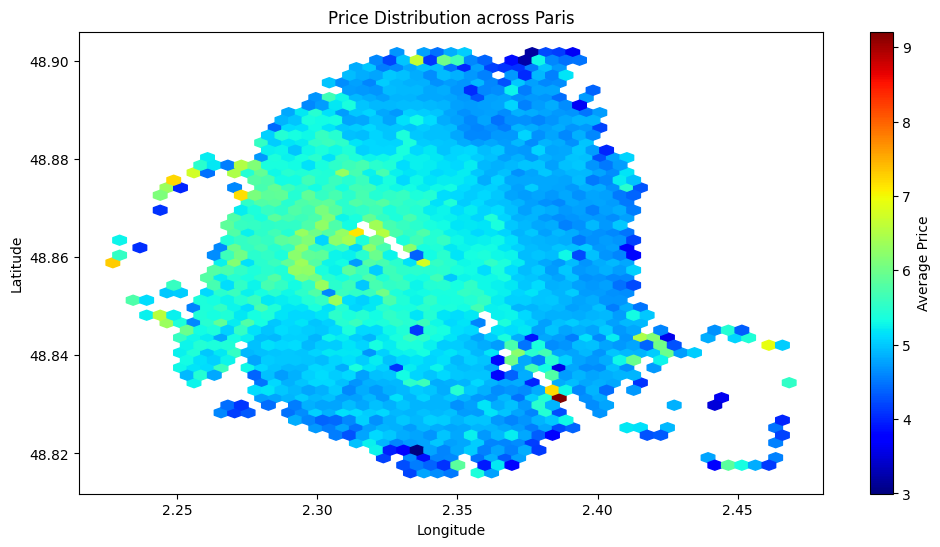

In [42]:
plt.figure(figsize=(12, 6))
plt.hexbin(df["longitude"], df["latitude"], C=df["price"], gridsize=50, cmap="jet", reduce_C_function=np.mean)
plt.colorbar(label="Average Price")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Price Distribution across Paris")
plt.show()

/var/folders/ck/_b2fnrn152vbbcxt5jf9gfth0000gn/T/ipykernel_27254/1044093396.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


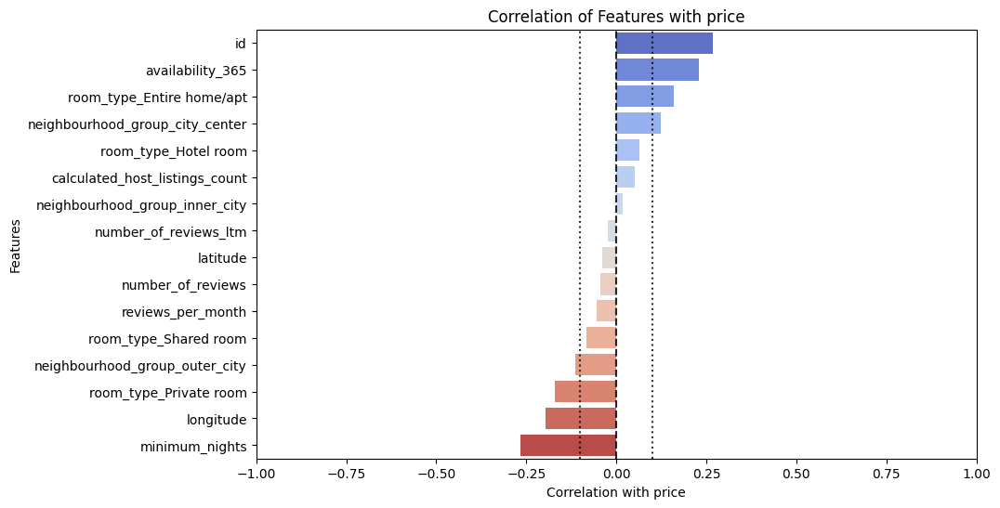

In [43]:
corr_df = cov_corr_function(df, 'price')
visualize_correlation(corr_df, 'price')

### *Transform other variables*

/opt/miniconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but FunctionTransformer was fitted without feature names
  warnings.warn(


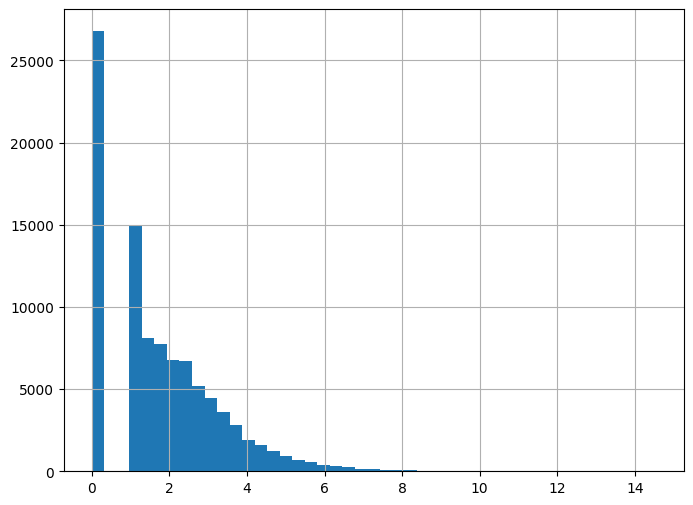

In [44]:
# transform the number_of_reviews column
df['number_of_reviews'] = cube_transformer.transform(df[['number_of_reviews']])
df['number_of_reviews'].hist(bins=45, figsize=(8, 6))
plt.show();

/opt/miniconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but FunctionTransformer was fitted without feature names
  warnings.warn(


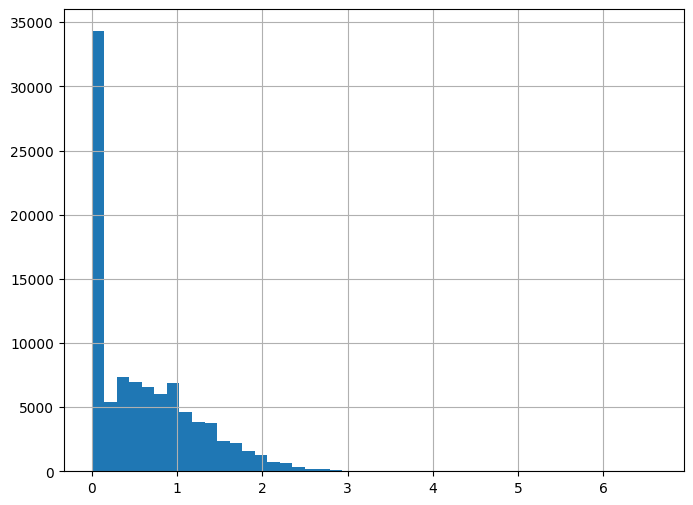

In [45]:
# transform the number_of_reviews column
df['reviews_per_month'] = sqrt_transformer.transform(df[['reviews_per_month']])
df['reviews_per_month'].hist(bins=45, figsize=(8, 6))
plt.show();

/opt/miniconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but FunctionTransformer was fitted without feature names
  warnings.warn(


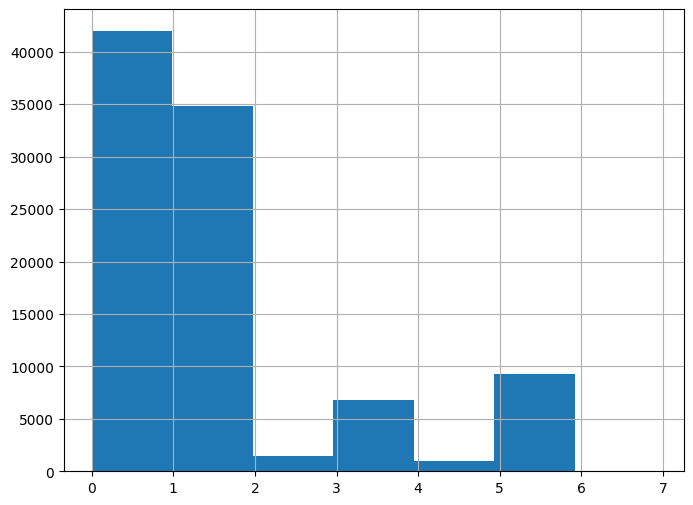

In [46]:
# transform the minimum_nights column
df['minimum_nights'] = log_transformer.transform(df[['minimum_nights']])
df['minimum_nights'].hist(bins=7, figsize=(8, 6))
plt.show();

/opt/miniconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but FunctionTransformer was fitted without feature names
  warnings.warn(


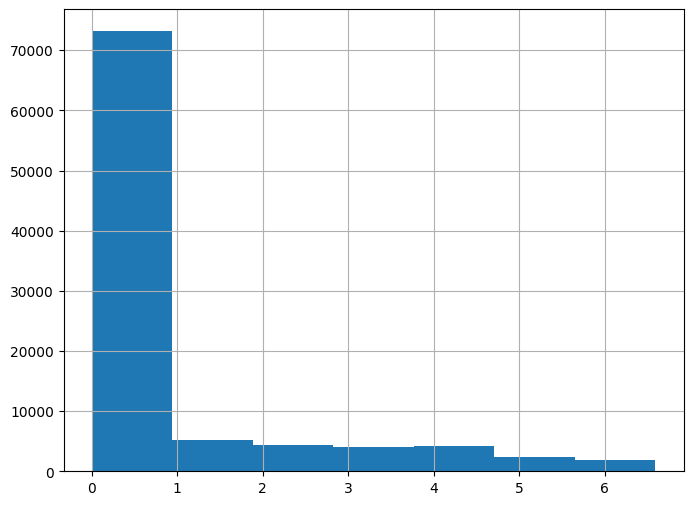

In [47]:
# transform the calculated_host_listings_count column
df['calculated_host_listings_count'] = log_transformer.transform(df[['calculated_host_listings_count']])
df['calculated_host_listings_count'].hist(bins=7, figsize=(8, 6))
plt.show();

/opt/miniconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but FunctionTransformer was fitted without feature names
  warnings.warn(


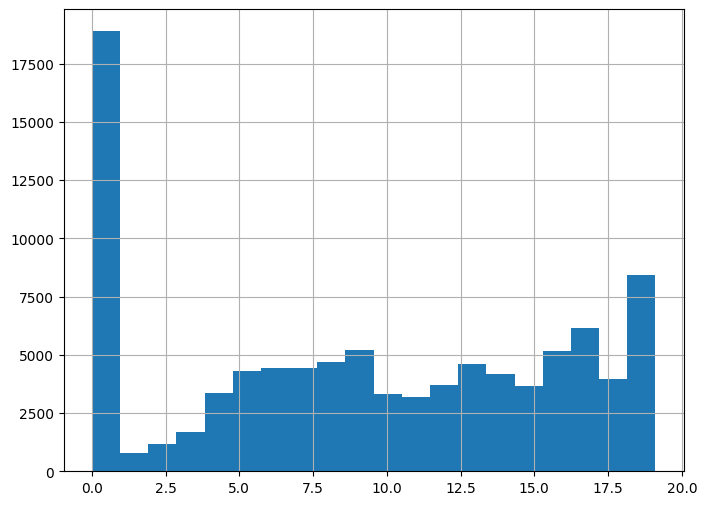

In [48]:
# transform the availability_365 column
df['availability_365'] = sqrt_transformer.transform(df[['availability_365']])
df['availability_365'].hist(bins=20, figsize=(8, 6))
plt.show();

/opt/miniconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but FunctionTransformer was fitted without feature names
  warnings.warn(


<Axes: >

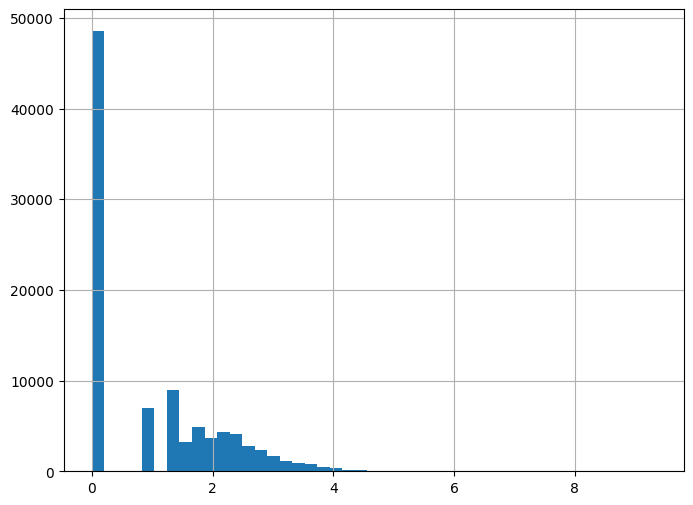

In [49]:
# transform the number_of_reviews column
df['number_of_reviews_ltm'] = cube_transformer.transform(df[['number_of_reviews_ltm']])
df['number_of_reviews_ltm'].hist(bins=45, figsize=(8, 6))

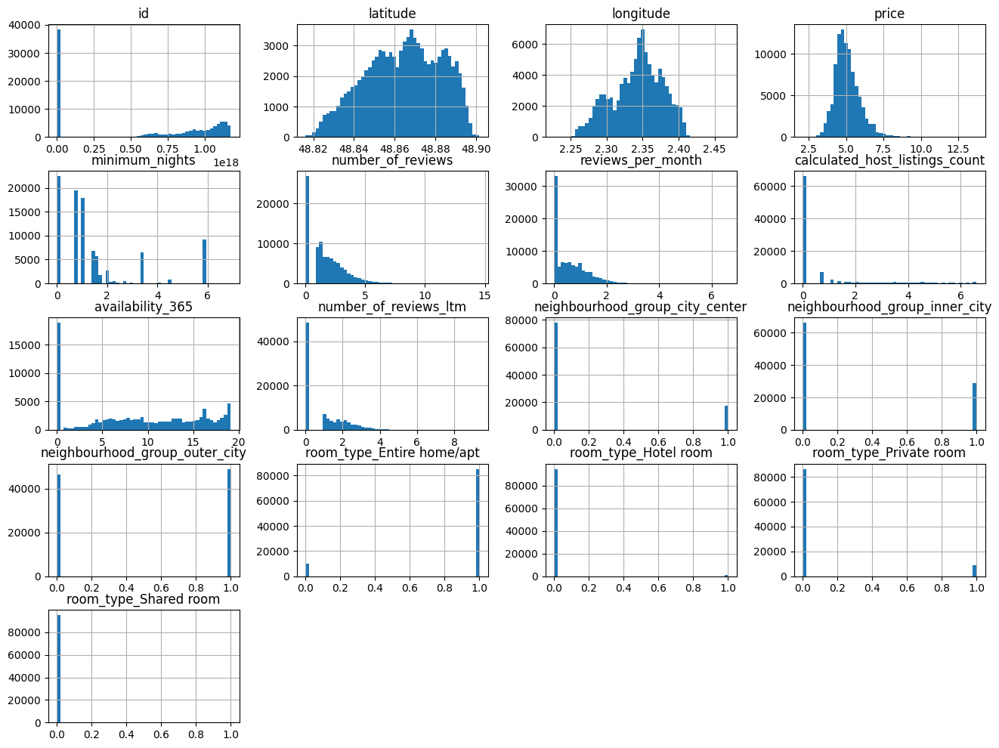

In [50]:
# show the histogram of the df
df.hist(bins=50, figsize=(16, 12))
plt.show();

/var/folders/ck/_b2fnrn152vbbcxt5jf9gfth0000gn/T/ipykernel_27254/1044093396.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


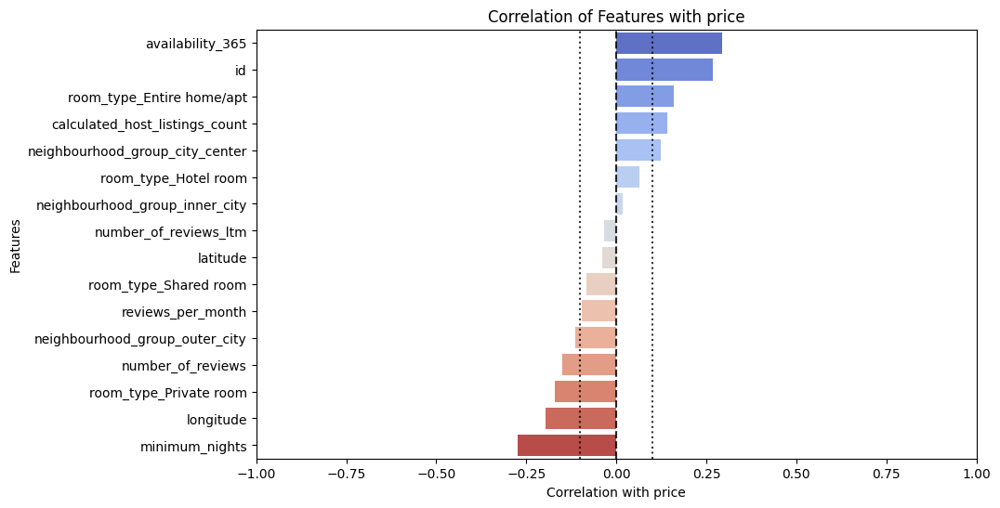

In [51]:
corr_df = cov_corr_function(df, 'price')
visualize_correlation(corr_df, 'price')

### Standardize data numerical data

In [52]:
df.columns

Index(['id', 'name', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'neighbourhood_group_city_center',
       'neighbourhood_group_inner_city', 'neighbourhood_group_outer_city',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room'],
      dtype='object')

In [53]:
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()

# Select only certain numerical columns to scale
numerical_cols = ['price', 'minimum_nights', 'number_of_reviews', 
                  'reviews_per_month', 'calculated_host_listings_count', 
                  'availability_365', 'number_of_reviews_ltm']

df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

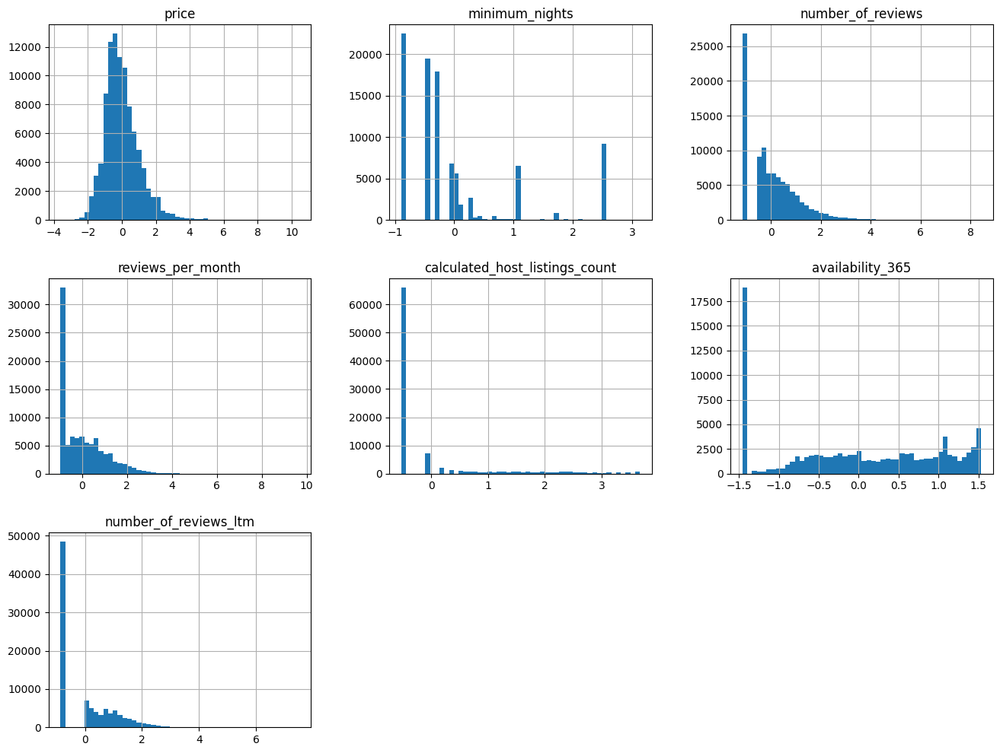

In [54]:
df[numerical_cols].hist(bins=50, figsize=(16, 12))
plt.show();

/var/folders/ck/_b2fnrn152vbbcxt5jf9gfth0000gn/T/ipykernel_27254/1044093396.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


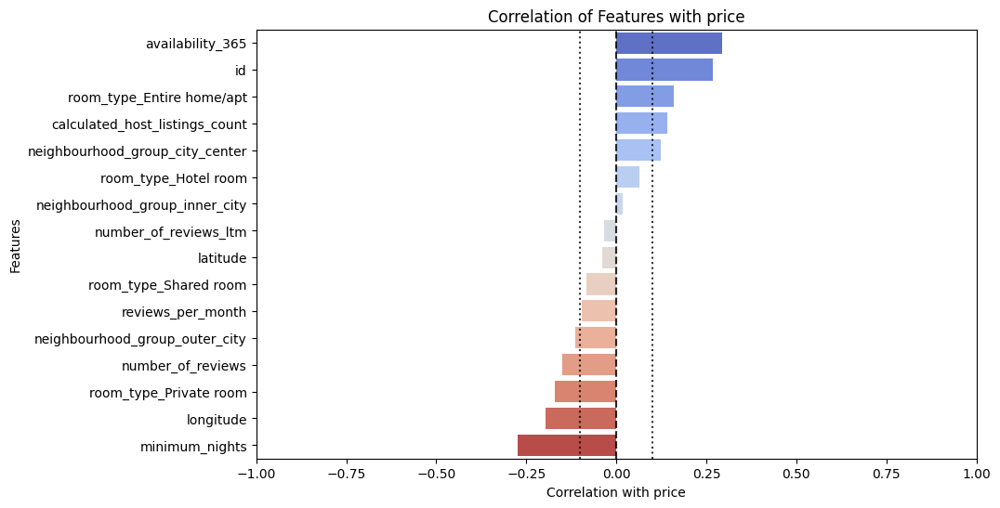

In [55]:
corr_df = cov_corr_function(df, 'price')
visualize_correlation(corr_df, 'price')

### **4. Select model and train**

In [56]:
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [57]:
df.columns

Index(['id', 'name', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'neighbourhood_group_city_center',
       'neighbourhood_group_inner_city', 'neighbourhood_group_outer_city',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room'],
      dtype='object')

In [58]:
# print how many columns we have
print(len(df.columns))

18


In [59]:
# Variables when only doing scaling
X1 = df[['availability_365', 'room_type_Entire home/apt', 'neighbourhood_group_city_center',
         'minimum_nights', 'longitude', 'room_type_Private room', 'neighbourhood_group_outer_city']]

# Variables when doing scaling and transformation
X2 = df[['availability_365', 'room_type_Entire home/apt', 'calculated_host_listings_count', 'neighbourhood_group_city_center',
         'minimum_nights', 'longitude', 'room_type_Private room', 'number_of_reviews', 'neighbourhood_group_outer_city']]

# All Variables when doing scaling and transformation
X_all = df[['id', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'neighbourhood_group_city_center',
       'neighbourhood_group_inner_city', 'neighbourhood_group_outer_city',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room']]


In [60]:
X1.shape, X2.shape, X_all.shape

((95384, 7), (95384, 9), (95384, 17))

NB: 

When only transforming price (and not the other features), we get the list of features in `X1` with correlation coefficents $\rho \geq 0.1$.

When transforming all features *AND* scaling them we get the list of features in `X2` with correlation coefficents $\rho \geq 0.1$.

#### K Means

In [61]:
def plot_elbow_silhouette(X, k_min=2, k_max=10):
    """
    Taken from the exercise solution:
    Plots the 'Elbow' (inertia) curve and the Silhouette scores 
    for K-Means clustering over a range of cluster counts.

    Parameters:
    -----------
    X : pandas DataFrame or NumPy array
        The input data to cluster. (Rows = samples, Columns = features)
    k_min : int, optional
        The lower bound of the cluster range (inclusive). Default=2.
    k_max : int, optional
        The upper bound of the cluster range (inclusive). Default=10.
    """
    # Lists to store metrics for each k
    inertias = []      # Elbow metric: Sum of squared distances to cluster centers
    silhouettes = []   # Silhouette score metric

    # Range of k values
    ks = range(k_min, k_max + 1)

    for k in ks:
        # Instantiate and fit K-Means
        km = KMeans(n_clusters=k, random_state=42)
        labels = km.fit_predict(X)

        # Store the inertia (SSE)
        inertias.append(km.inertia_)

        # Silhouette score (only valid for k > 1)
        s_score = silhouette_score(X, labels)
        silhouettes.append(s_score)

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Plot the Elbow curve
    axes[0].plot(ks, inertias, marker='o')
    axes[0].set_title("Elbow Method (Inertia)")
    axes[0].set_xlabel("Number of clusters (k)")
    axes[0].set_ylabel("Inertia (SSE)")

    # Plot the Silhouette scores
    axes[1].plot(ks, silhouettes, marker='o', color='red')
    axes[1].set_title("Silhouette Scores")
    axes[1].set_xlabel("Number of clusters (k)")
    axes[1].set_ylabel("Average Silhouette Score")

    plt.tight_layout()
    plt.show()

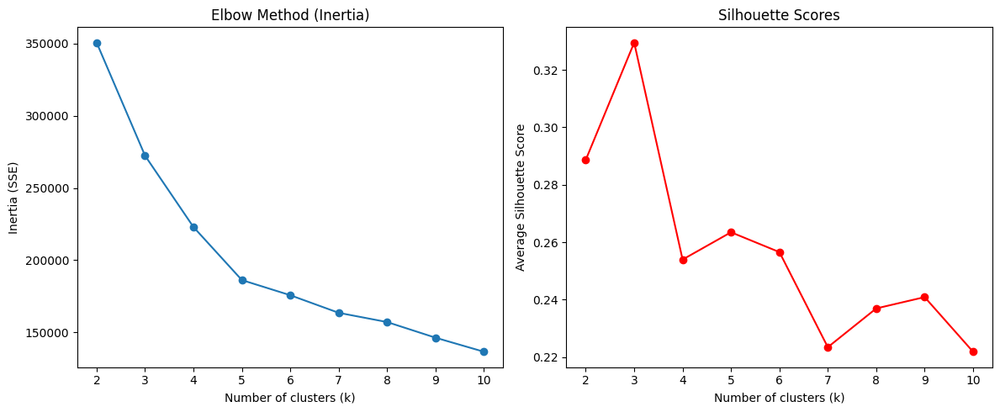

In [62]:
plot_elbow_silhouette(X2)

In [63]:
# 2) Instantiate KMeans with either 3 or 5 clusters according to the elbow & silhouette plot
k = 3
k_means = KMeans(n_clusters=k, random_state=42)

# 3) Fit it to the data
y_pred = k_means.fit_predict(X2)
k_means.cluster_centers_

# 4) Give the cluster labels, e.g. km.labels_
km_labels = k_means.labels_

# Add the cluster labels to the original dataframe
df['kmeans_cluster'] = km_labels

In [64]:
# get silhouette score
silhouette_score(X2, km_labels)

0.3294546102424052

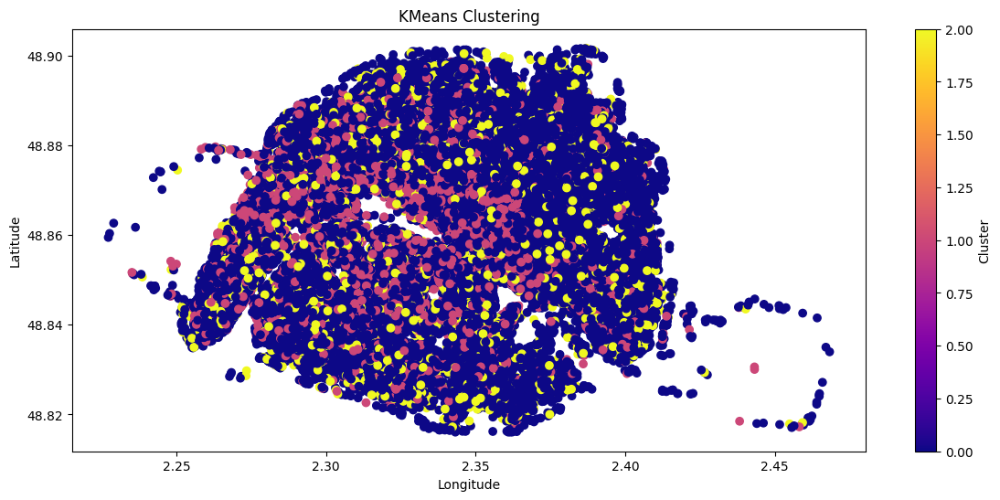

In [65]:
# plot the clusters on longitude and latitude
plt.figure(figsize=(14, 6))
plt.scatter(df['longitude'], df['latitude'], c=df['kmeans_cluster'], cmap='plasma')
plt.colorbar(label='Cluster')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('KMeans Clustering')
plt.show()

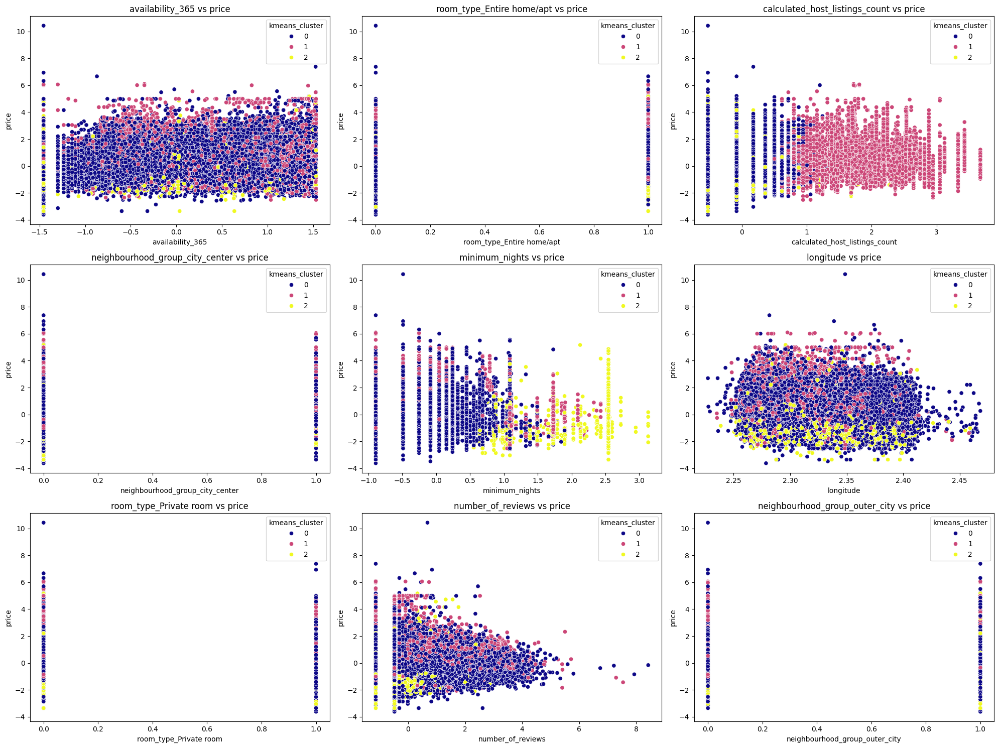

In [66]:
# Create subplots for each variable against price
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15))
axes = axes.flatten()

for i, var in enumerate(X2):
    sns.scatterplot(data=df, x=var, y='price', hue='kmeans_cluster', ax=axes[i], palette="plasma")
    axes[i].set_title(f'{var} vs price')

plt.tight_layout()
plt.show()

In [67]:
# make a three dimensional plot with plotly
fig = px.scatter_3d(df, x='availability_365', y='calculated_host_listings_count', z='price', color='kmeans_cluster', color_continuous_scale='plasma')
fig.show();

In [68]:
# make a three dimensional plot with plotly
fig = px.scatter_3d(df, x='minimum_nights', y='longitude', z='price', color='kmeans_cluster', color_continuous_scale='plasma')
fig.show();

### DBSCAN

In [69]:
import itertools 
from sklearn.cluster import DBSCAN

In [70]:
epsilons1 = np.array([0.05, 0.1, 0.2, 0.35, 0.4, 0.5, 0.65])
epsilons1

array([0.05, 0.1 , 0.2 , 0.35, 0.4 , 0.5 , 0.65])

In [71]:
min_samples1 = np.array([3, 5, 10, 20, 35, 50])
min_samples1

array([ 3,  5, 10, 20, 35, 50])

In [72]:
combinations = list(itertools.product(epsilons1, min_samples1))
N = len(combinations)
N

42

In [73]:
epsilons2 = np.array([0.35, 0.5, 0.85, 0.9, 0.95])
min_samples2 = np.array([65, 75, 85, 90, 95, 100, 250, 500])

In [74]:
combinations1 = list(itertools.product(epsilons1, min_samples2))
N1 = len(combinations1)
N1

56

In [75]:
combinations2 = list(itertools.product(epsilons2, min_samples2))
N2 = len(combinations2)
N2

40

In [76]:
def get_scores_and_labels(combinations, X):
    """
    Function to get the silhouette scores and labels for DBSCAN clustering.
    
    Arguments:
    combinations -- list of tuples with eps and min_samples values
    X -- dataframe with the data
    
    Returns:
    scores -- list of silhouette scores
    labels -- list of labels
    """
    scores = []
    all_labels_list = []
    
    for i, (eps, num_samples) in enumerate(combinations):
        dbscan_model = DBSCAN(eps=eps, min_samples=num_samples).fit(X)
        labels = dbscan_model.labels_
        labels_set = set(labels)
        num_clusters = len(labels_set)
        if -1 in labels_set:
            num_clusters -= 1
        
        if (num_clusters < 2) or (num_clusters > 50):
            scores.append(-10)
            all_labels_list.append("bad")
            c = (eps, num_samples)
            print(f"Combination {c} on iteration {i+1} of {N} has {num_clusters} clusters")
            continue
        
        scores.append(silhouette_score(X, labels))
        all_labels_list.append(labels)

    best_index = np.argmax(scores)
    best_params = combinations[best_index]
    best_labels = all_labels_list[best_index]
    best_score = scores[best_index]
    return {'best epsilon value': best_params[0], 
            'best minimum samples': best_params[1], 
            'best labels': best_labels, 
            'best Silhoutte score': best_score}

In [77]:
best_dict2 = get_scores_and_labels(combinations1, X2)
best_dict2

Combination (0.1, 65) on iteration 9 of 42 has 61 clusters
Combination (0.1, 75) on iteration 10 of 42 has 51 clusters
Combination (0.2, 65) on iteration 17 of 42 has 58 clusters
Combination (0.35, 65) on iteration 25 of 42 has 58 clusters
Combination (0.4, 65) on iteration 33 of 42 has 66 clusters
Combination (0.4, 75) on iteration 34 of 42 has 59 clusters
Combination (0.4, 85) on iteration 35 of 42 has 51 clusters


{'best epsilon value': 0.05,
 'best minimum samples': 500,
 'best labels': array([-1, -1,  0, ..., -1, -1, -1]),
 'best Silhoutte score': 0.24983648744734366}

In [78]:
# fit model to the X2 data
dbscan = DBSCAN(eps=0.05, min_samples=500)
dbscan.fit(X2)
df['dbscan_cluster'] = dbscan.labels_

# print the number of clusters
print(f"There are {len(set(dbscan.labels_))} clusters")

There are 3 clusters


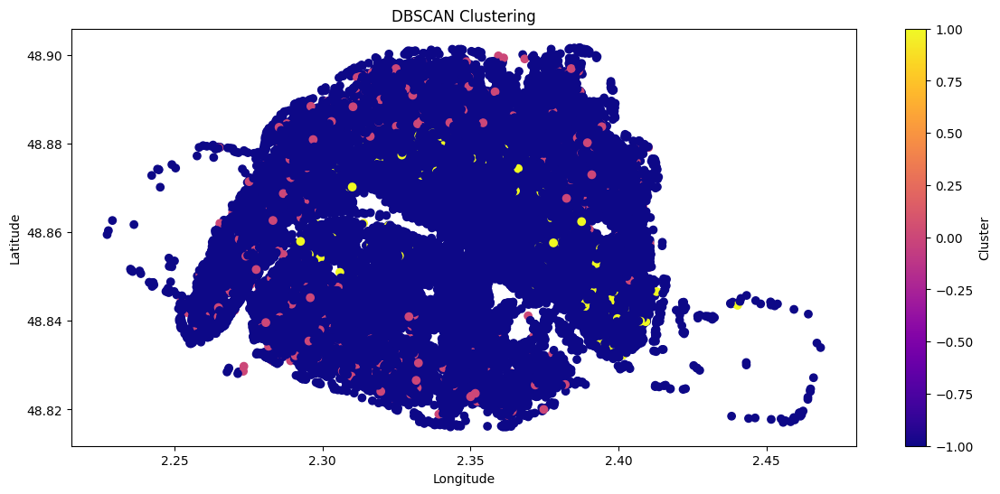

In [79]:
# plot the clusters on longitude and latitude
plt.figure(figsize=(14, 6))
plt.scatter(df['longitude'], df['latitude'], c=df['dbscan_cluster'], cmap='plasma')
plt.colorbar(label='Cluster')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('DBSCAN Clustering')
plt.show()

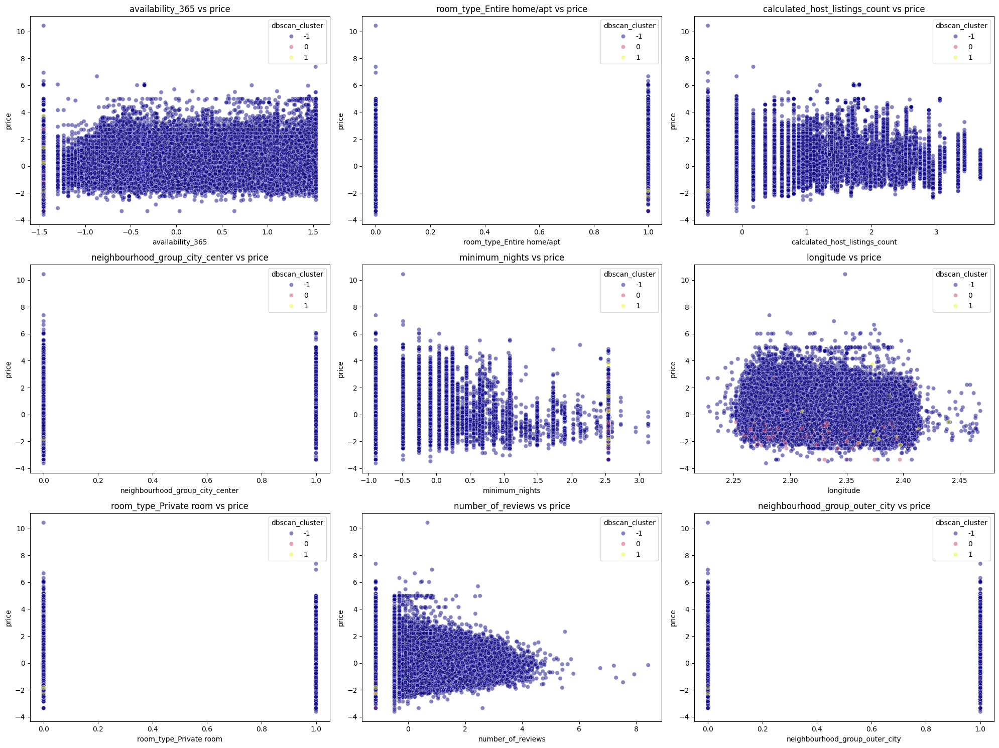

In [80]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15))
axes = axes.flatten()

for i, var in enumerate(X2):
    sns.scatterplot(data=df, x=var, y='price', hue='dbscan_cluster', ax=axes[i], palette="plasma", alpha=0.5)
    axes[i].set_title(f'{var} vs price')

plt.tight_layout()
plt.show()

In [81]:
# 3d plot with plotly
fig = px.scatter_3d(df, x='availability_365', y='calculated_host_listings_count', z='price', color='dbscan_cluster', color_continuous_scale='plasma')
fig.show();

In [82]:
# 3d plot with plotly
fig = px.scatter_3d(df, x='minimum_nights', y='longitude', z='price', color='dbscan_cluster', color_continuous_scale='plasma')
fig.show();

## **4. Principal Component Analysis (PCA)**

In [83]:
from sklearn.decomposition import PCA

In [84]:
pca1 = PCA(n_components=2)
X2D = pca1.fit_transform(X2)
X2D = pd.DataFrame(X2D, columns=['PC1', 'PC2'])
X2D.head()

,PC1,PC2
0,-2.691953,-0.490684
1,-1.115498,0.749673
2,-2.959454,-1.022628
3,-2.906857,-1.022861
4,-0.786275,0.823948


In [85]:
# Get the PCA component loadings (how much each original feature contributes to each principal component)
loadings = pd.DataFrame(pca1.components_, columns=X2.columns)

# Display the loadings with only 3 decimal places
(loadings.round(3))
loadings

,availability_365,room_type_Entire home/apt,calculated_host_listings_count,neighbourhood_group_city_center,minimum_nights,longitude,room_type_Private room,number_of_reviews,neighbourhood_group_outer_city
0,0.633570,-0.018707,0.425908,0.046810,-0.554464,-0.001880,0.012487,0.322916,-0.052779
1,-0.249596,-0.037134,-0.614241,-0.011374,-0.382510,0.004706,0.035147,0.641351,0.000689


In [86]:
pca2 = PCA()
pca2.fit(X2)
cumsum = np.cumsum(pca2.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1
print(f"We initially started with {len(cumsum)} features.\nThe PCA suggests we should have {d} features as the minimum number of dimensions required to preserve 95% of the training sets variance")

We initially started with 9 features.
The PCA suggests we should have 6 features as the minimum number of dimensions required to preserve 95% of the training sets variance


In [87]:
cumsum

array([0.30903754, 0.54651118, 0.73473465, 0.87917059, 0.94233351,
       0.97829524, 0.99848094, 0.99977217, 1.        ])

In [88]:
# rescale the array so it indexes from 1
cumsum = np.insert(cumsum, 0, 0)
cumsum

array([0.        , 0.30903754, 0.54651118, 0.73473465, 0.87917059,
       0.94233351, 0.97829524, 0.99848094, 0.99977217, 1.        ])

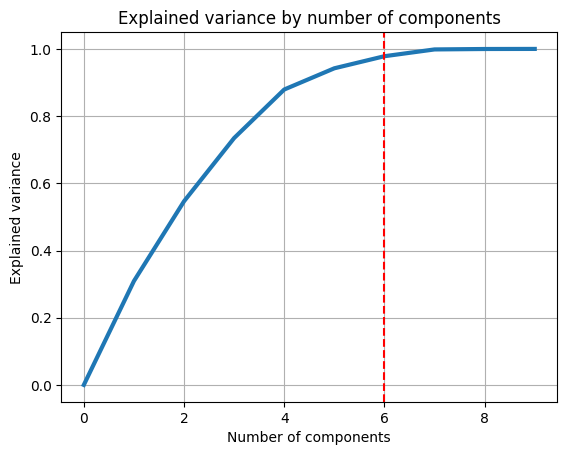

In [89]:
plt.plot(cumsum, linewidth=3)
plt.grid()
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.title('Explained variance by number of components')
plt.axvline(d, color='red', linestyle='--')
plt.show()

In [90]:
# create PCA with 6 components
pca = PCA(n_components=6)
X6D = pca.fit_transform(X2)
X6D = pd.DataFrame(X6D, columns=[f'PC{i+1}' for i in range(6)])
X6D.head()

,PC1,PC2,PC3,PC4,PC5,PC6
0,-2.691953,-0.490684,1.099090,0.564172,0.474483,-0.018656
1,-1.115498,0.749673,0.030884,-0.780877,0.449247,0.250765
2,-2.959454,-1.022628,0.546224,0.426093,0.386779,-0.022611
3,-2.906857,-1.022861,0.655012,0.408348,-0.471503,-0.064562
4,-0.786275,0.823948,-0.616719,-1.273904,0.387508,0.331134


In [91]:
# Get the PCA component loadings (how much each original feature contributes to each principal component)
loadings = pd.DataFrame(pca.components_, columns=X2.columns)

# Display the loadings with only 3 decimal places
(loadings.round(3))

,availability_365,room_type_Entire home/apt,calculated_host_listings_count,neighbourhood_group_city_center,minimum_nights,longitude,room_type_Private room,number_of_reviews,neighbourhood_group_outer_city
0,0.634,-0.019,0.426,0.047,-0.554,-0.002,0.012,0.323,-0.053
1,-0.250,-0.037,-0.614,-0.011,-0.383,0.005,0.035,0.641,0.001
2,-0.239,0.022,0.478,0.085,0.499,0.000,-0.022,0.667,-0.109
3,0.690,0.075,-0.447,-0.008,0.535,-0.001,-0.068,0.167,0.018
4,0.001,-0.019,0.108,-0.491,0.025,-0.019,0.021,0.108,0.856
5,-0.062,0.721,0.011,0.014,-0.102,-0.001,-0.681,0.005,0.042


In [92]:
for i in range(loadings.shape[0]):  # Loop through each principal component
    print(f"\nPrincipal Component {i+1} Top Contributing Features:")
    print(loadings.iloc[i].abs().sort_values(ascending=False).head(5))  # Top 5 strongest features


Principal Component 1 Top Contributing Features:
availability_365                  0.633570
minimum_nights                    0.554464
calculated_host_listings_count    0.425908
number_of_reviews                 0.322916
neighbourhood_group_outer_city    0.052779
Name: 0, dtype: float64

Principal Component 2 Top Contributing Features:
number_of_reviews                 0.641351
calculated_host_listings_count    0.614241
minimum_nights                    0.382510
availability_365                  0.249596
room_type_Entire home/apt         0.037134
Name: 1, dtype: float64

Principal Component 3 Top Contributing Features:
number_of_reviews                 0.666989
minimum_nights                    0.499224
calculated_host_listings_count    0.478283
availability_365                  0.238847
neighbourhood_group_outer_city    0.108742
Name: 2, dtype: float64

Principal Component 4 Top Contributing Features:
availability_365                  0.689503
minimum_nights                    0.5348

## **5. Redoing the Cluster Analysis with Principle Components as features**

### KMeans Clustering

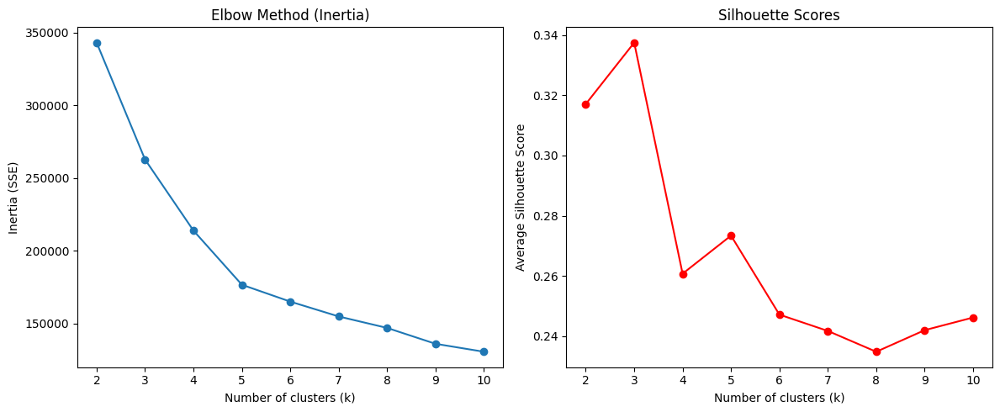

In [93]:
plot_elbow_silhouette(X6D)

In [94]:
k = 3
k_means = KMeans(n_clusters=k, random_state=42)

# 3) Fit it to the data
y_pred = k_means.fit_predict(X6D)
k_means.cluster_centers_

# 4) Give the cluster labels, e.g. km.labels_
km_labels = k_means.labels_

# Add the cluster labels to the original dataframe
df['pca_kmeans_cluster'] = km_labels

In [95]:
# get silhouette score
silhouette_score(X6D, km_labels)

0.3374699077764045

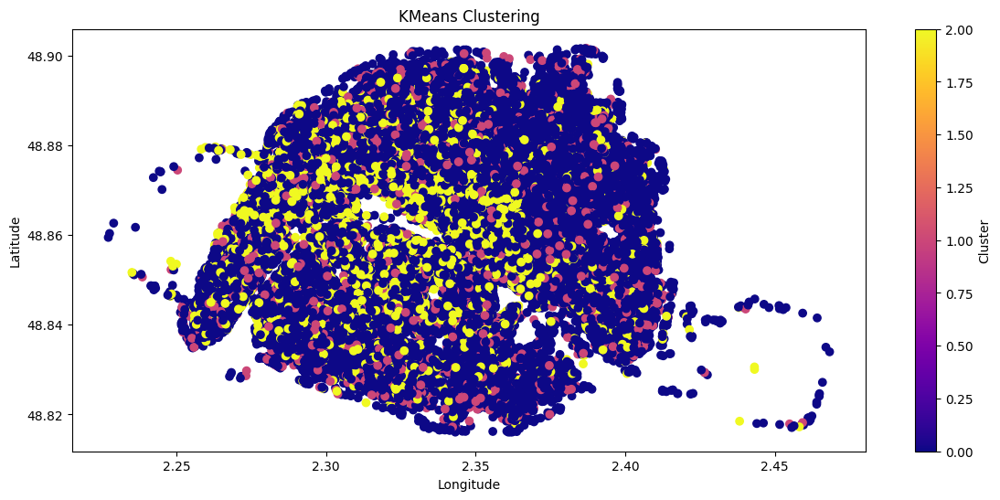

In [96]:
# plot the clusters on longitude and latitude
plt.figure(figsize=(14, 6))
plt.scatter(df['longitude'], df['latitude'], c=df['pca_kmeans_cluster'], cmap='plasma')
plt.colorbar(label='Cluster')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('KMeans Clustering')
plt.show()

### DBSCAN Clustering

In [97]:
best_dict2 = get_scores_and_labels(combinations2, X6D)
best_dict2

Combination (0.35, 65) on iteration 1 of 42 has 59 clusters
Combination (0.9, 65) on iteration 25 of 42 has 1 clusters
Combination (0.9, 75) on iteration 26 of 42 has 1 clusters
Combination (0.9, 85) on iteration 27 of 42 has 1 clusters
Combination (0.9, 90) on iteration 28 of 42 has 1 clusters
Combination (0.9, 95) on iteration 29 of 42 has 1 clusters
Combination (0.9, 100) on iteration 30 of 42 has 1 clusters
Combination (0.9, 250) on iteration 31 of 42 has 1 clusters
Combination (0.95, 75) on iteration 34 of 42 has 1 clusters
Combination (0.95, 85) on iteration 35 of 42 has 1 clusters
Combination (0.95, 90) on iteration 36 of 42 has 1 clusters
Combination (0.95, 95) on iteration 37 of 42 has 1 clusters
Combination (0.95, 100) on iteration 38 of 42 has 1 clusters
Combination (0.95, 250) on iteration 39 of 42 has 1 clusters


{'best epsilon value': 0.95,
 'best minimum samples': 65,
 'best labels': array([0, 0, 0, ..., 0, 0, 0]),
 'best Silhoutte score': 0.265570236662021}

In [98]:
# fit model to the X2 data
dbscan = DBSCAN(eps=0.95, min_samples=65)
dbscan.fit(X6D)
df['pca_dbscan_cluster'] = dbscan.labels_

# print the number of clusters
print(f"There are {len(set(dbscan.labels_))} clusters")

There are 3 clusters


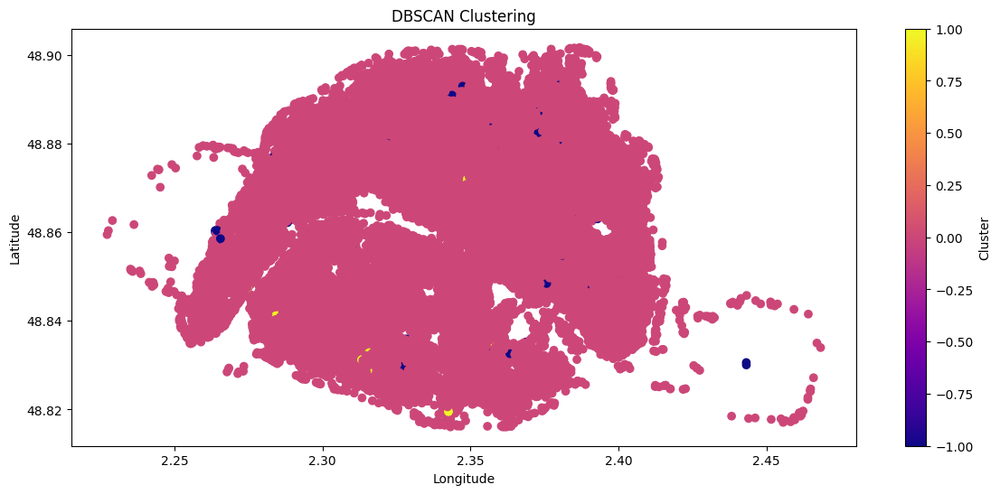

In [99]:
# plot the clusters on longitude and latitude
plt.figure(figsize=(14, 6))
plt.scatter(df['longitude'], df['latitude'], c=df['pca_dbscan_cluster'], cmap='plasma')
plt.colorbar(label='Cluster')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('DBSCAN Clustering')
plt.show()